In [1]:
freq = 15

In [2]:
paciente='paciente3'

In [3]:
import codigo
from codigo import utils
from codigo import model_LSTM
from codigo import model_utils
from cg_ega.cg_ega import CG_EGA

In [4]:
import pandas as pd
import numpy as np
pd.set_option('mode.chained_assignment',None)
import matplotlib.pyplot as plt
import seaborn as sns
import math

%matplotlib inline

In [5]:
import tensorflow as tf
from tensorflow import keras

In [6]:
with open('dataset/generado/'+paciente+'/array_Xtest.npy', 'rb') as f:
    array_Xtest = np.load(f)

In [7]:
len(array_Xtest)

3586

In [8]:
with open('dataset/generado/'+paciente+'/array_Ytest.npy', 'rb') as f:
    array_Ytest = np.load(f)

In [9]:
len(array_Ytest)

3586

In [10]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Pruebas Vanilla LSTM con dropout

In [11]:
model = keras.models.load_model('modelos/'+paciente+'/vanilla_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [12]:
len(array_Ytest)

3586

113/113 [==============================] - 2s 10ms/step


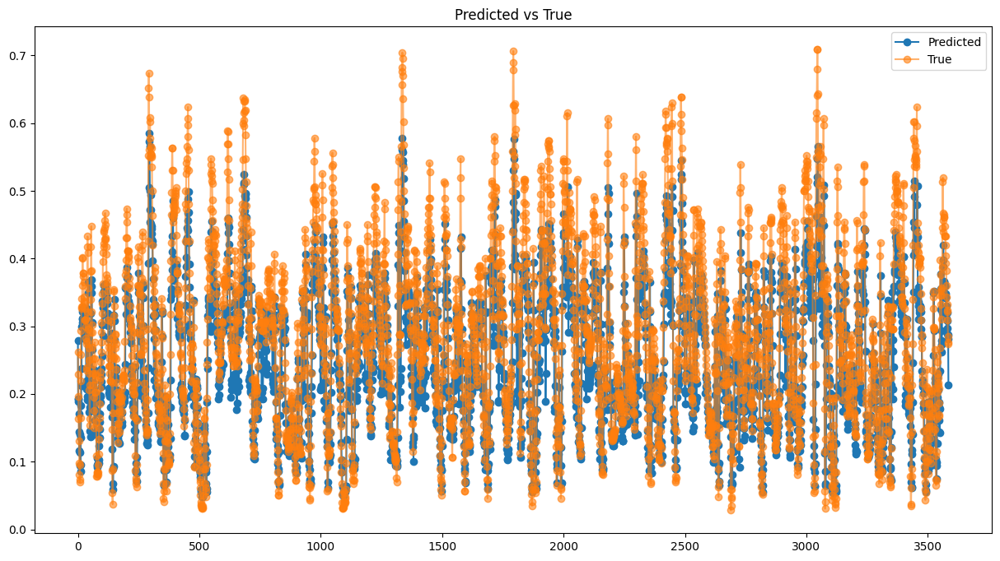

In [13]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [14]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.05625053809463329,
 'mse': 0.07470053707540882,
 'rmse': 0.005580170239354526}

In [15]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,168.025513
1,128.540527
2,126.786285
3,128.879120
4,118.444511
...,...
3581,176.841232
3582,172.575134
3583,172.096497
3584,169.611847


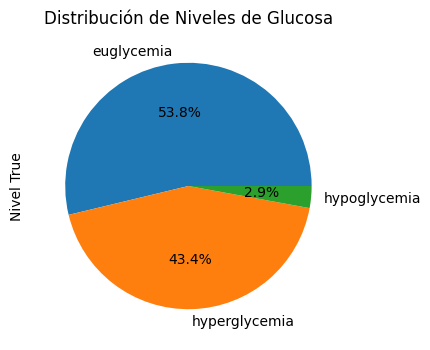

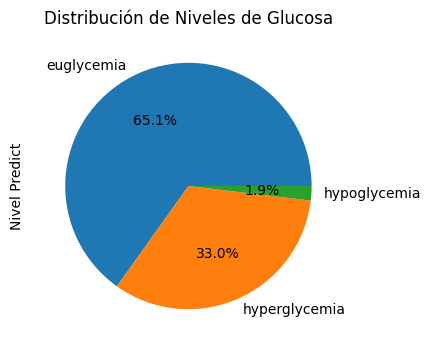

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,168.025513,euglycemia
1,145.363636,euglycemia,128.540527,euglycemia
2,130.272727,euglycemia,126.786285,euglycemia
3,115.181818,euglycemia,128.879120,euglycemia
4,100.090909,euglycemia,118.444511,euglycemia


In [16]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


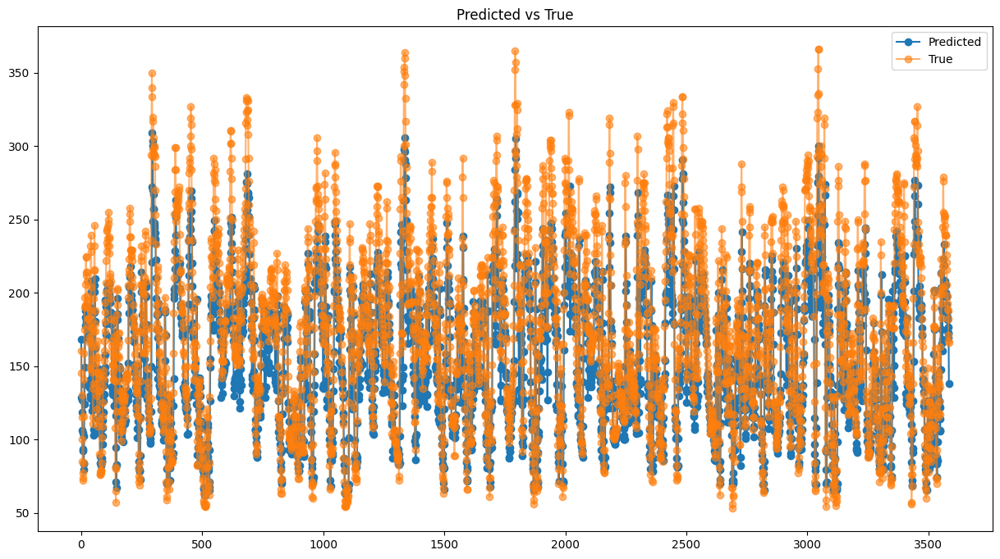

{'mae': 25.8752465611972, 'mse': 34.36224638582621, 'rmse': 1180.7639766802263}

In [17]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [18]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [19]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,168.025513
2023-01-01 00:15:00,145.363636,128.540527
2023-01-01 00:30:00,130.272727,126.786285
2023-01-01 00:45:00,115.181818,128.879120
2023-01-01 01:00:00,100.090909,118.444511
...,...,...
2023-02-07 07:15:00,188.000000,176.841232
2023-02-07 07:30:00,182.000000,172.575134
2023-02-07 07:45:00,171.000000,172.096497
2023-02-07 08:00:00,167.000000,169.611847


AP, BE, EP: (0.8783821478382148, 0.08479776847977685, 0.03682008368200837)


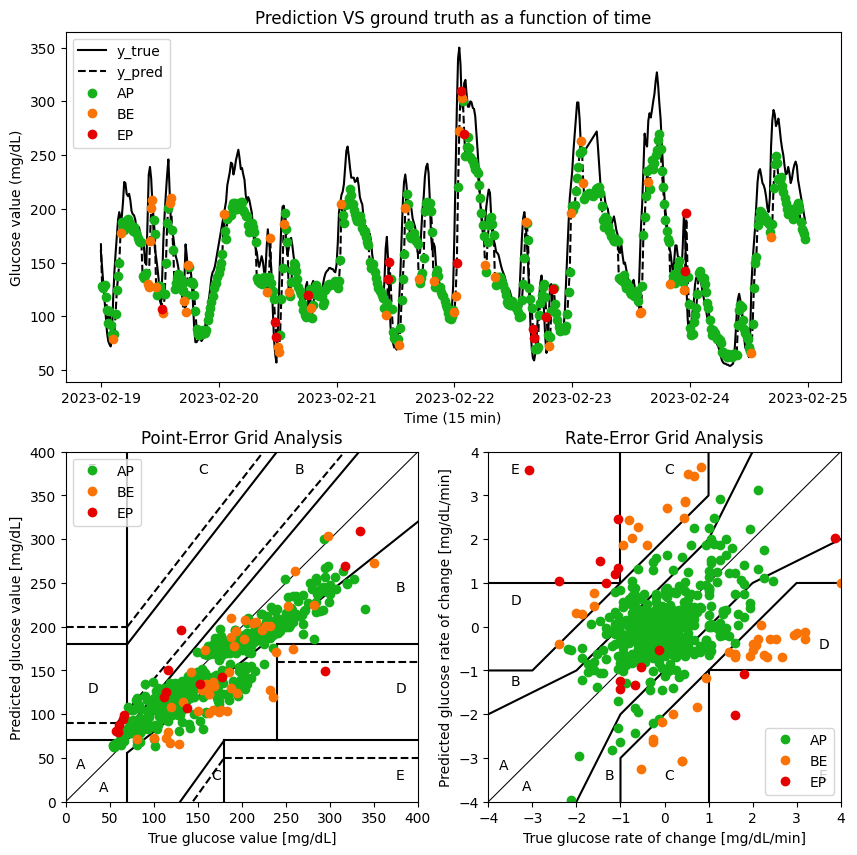

In [20]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [21]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,160.454545,168.025513,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,145.363636,128.540527,-1.006061,-2.632332,AP,A,B
2,2023-02-19 00:30:00,130.272727,126.786285,-1.006061,-0.116949,AP,A,A
3,2023-02-19 00:45:00,115.181818,128.879120,-1.006061,0.139522,AP,A,B
4,2023-02-19 01:00:00,100.090909,118.444511,-1.006061,-0.695641,AP,A,A
...,...,...,...,...,...,...,...,...
3581,2023-03-28 07:15:00,188.000000,176.841232,-0.066667,-0.321974,AP,A,A
3582,2023-03-28 07:30:00,182.000000,172.575134,-0.400000,-0.284407,AP,A,A
3583,2023-03-28 07:45:00,171.000000,172.096497,-0.733333,-0.031909,AP,A,A
3584,2023-03-28 08:00:00,167.000000,169.611847,-0.266667,-0.165643,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [22]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [23]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 50ms/step


,Glucose level Predict,Glucose level True
0,0.278316,0.261858
1,0.192479,0.229051


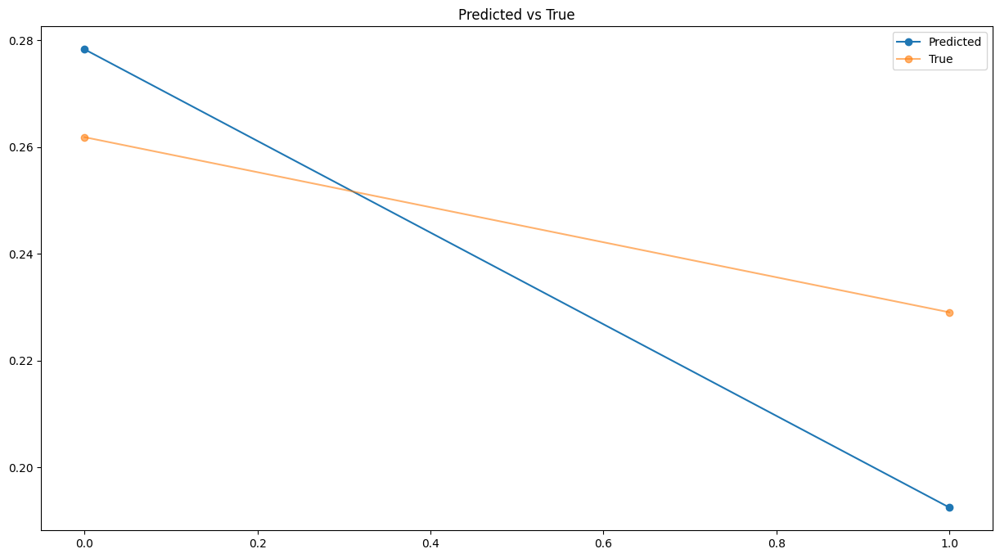

{'mae': 0.02651528907505421,
 'mse': 0.028358372996459165,
 'rmse': 0.0008041973190063043}

In [24]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [25]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,168.025513,160.454545
1,128.540527,145.363636


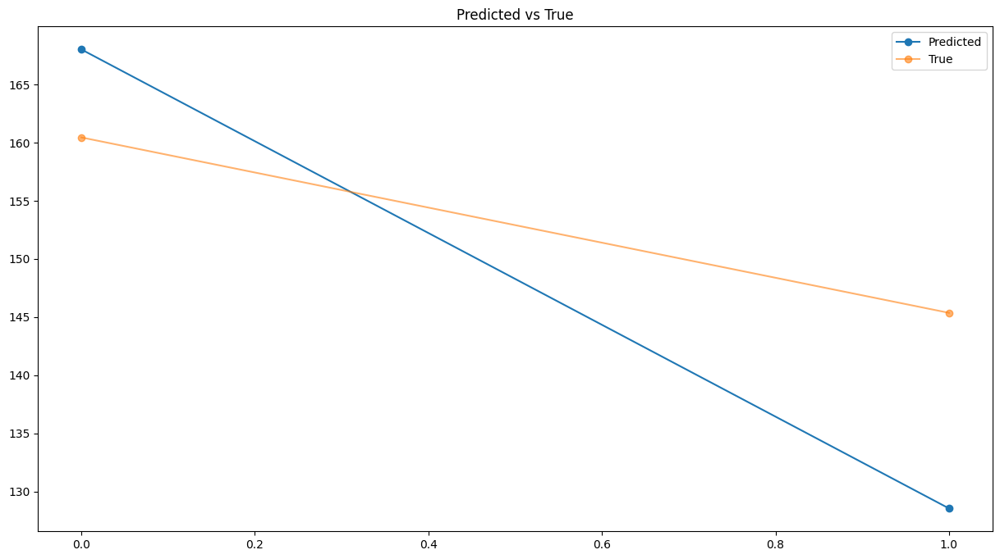

{'mae': 12.197038130326717,
 'mse': 13.04485611372832,
 'rmse': 170.16827102787514}

In [26]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Vanilla LSTM sin dropout

In [27]:
model = keras.models.load_model('modelos/'+paciente+'/vanilla_NO_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [28]:
len(array_Ytest)

3586

113/113 [==============================] - 1s 10ms/step


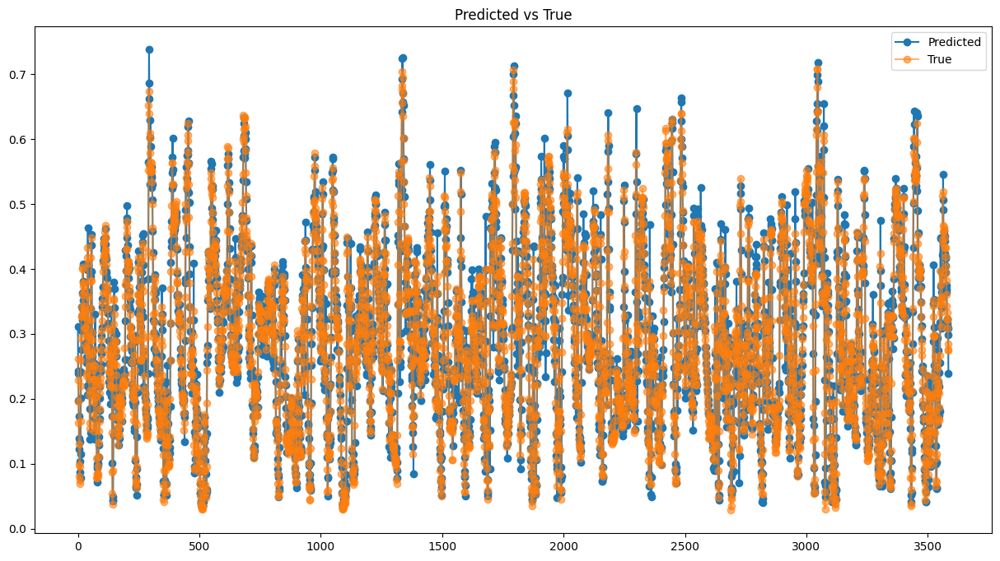

In [29]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [30]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.03436596296197054,
 'mse': 0.049409621647766626,
 'rmse': 0.002441310711375448}

In [31]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,182.985321
1,151.586334
2,150.173004
3,130.466751
4,119.396309
...,...
3581,183.889404
3582,185.469971
3583,181.856766
3584,177.275909


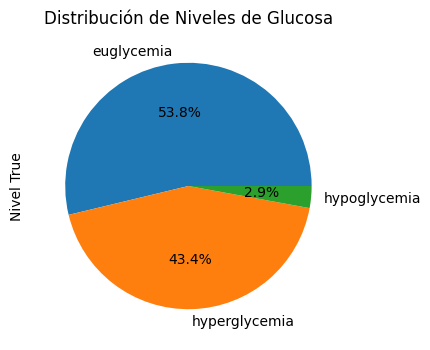

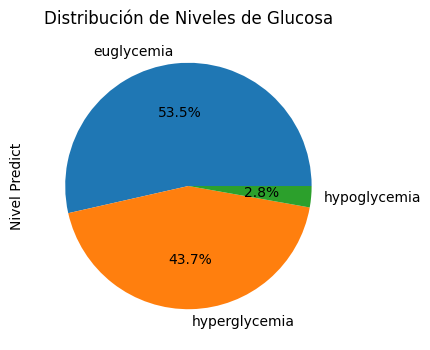

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,182.985321,hyperglycemia
1,145.363636,euglycemia,151.586334,euglycemia
2,130.272727,euglycemia,150.173004,euglycemia
3,115.181818,euglycemia,130.466751,euglycemia
4,100.090909,euglycemia,119.396309,euglycemia


In [32]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


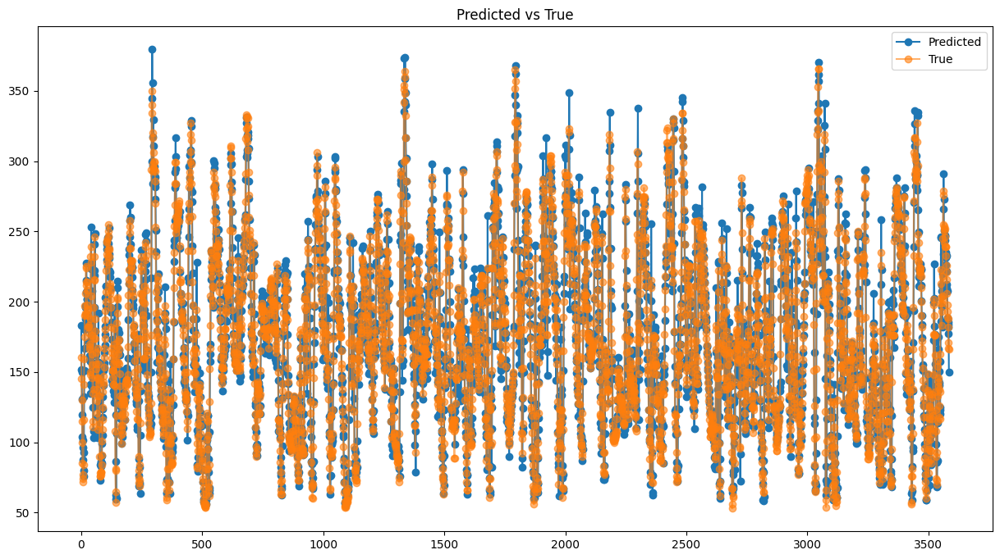

{'mae': 15.808342918870894,
 'mse': 22.728425663201076,
 'rmse': 516.5813331276572}

In [33]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [34]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [35]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,182.985321
2023-01-01 00:15:00,145.363636,151.586334
2023-01-01 00:30:00,130.272727,150.173004
2023-01-01 00:45:00,115.181818,130.466751
2023-01-01 01:00:00,100.090909,119.396309
...,...,...
2023-02-07 07:15:00,188.000000,183.889404
2023-02-07 07:30:00,182.000000,185.469971
2023-02-07 07:45:00,171.000000,181.856766
2023-02-07 08:00:00,167.000000,177.275909


AP, BE, EP: (0.8694560669456067, 0.09539748953974896, 0.035146443514644354)


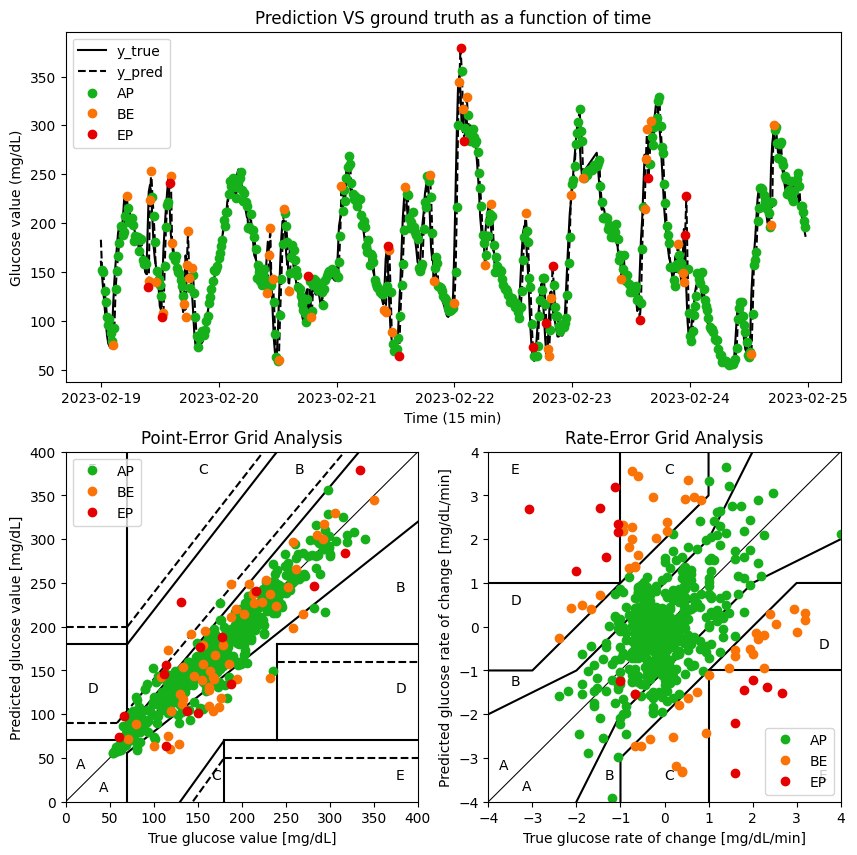

In [36]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [37]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,160.454545,182.985321,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,145.363636,151.586334,-1.006061,-2.093266,AP,A,B
2,2023-02-19 00:30:00,130.272727,150.173004,-1.006061,-0.094222,AP,A,A
3,2023-02-19 00:45:00,115.181818,130.466751,-1.006061,-1.313750,AP,A,A
4,2023-02-19 01:00:00,100.090909,119.396309,-1.006061,-0.738029,AP,A,A
...,...,...,...,...,...,...,...,...
3581,2023-03-28 07:15:00,188.000000,183.889404,-0.066667,-0.302161,AP,A,A
3582,2023-03-28 07:30:00,182.000000,185.469971,-0.400000,0.105371,AP,A,A
3583,2023-03-28 07:45:00,171.000000,181.856766,-0.733333,-0.240880,AP,A,A
3584,2023-03-28 08:00:00,167.000000,177.275909,-0.266667,-0.305390,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [38]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [39]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 49ms/step


,Glucose level Predict,Glucose level True
0,0.310838,0.261858
1,0.242579,0.229051


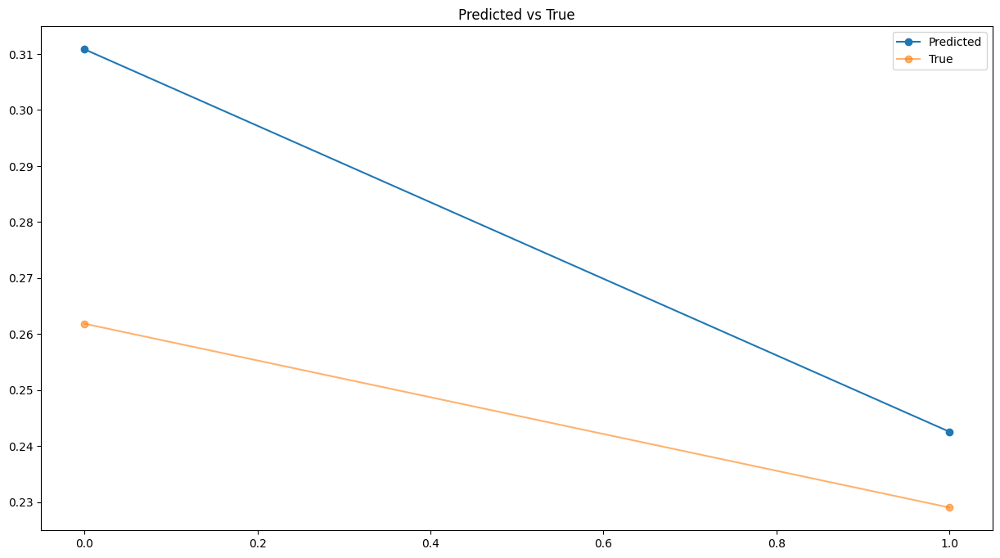

{'mae': 0.03125375942750411,
 'mse': 0.03593064207606635,
 'rmse': 0.0012910110399983897}

In [40]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [41]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,182.985275,160.454545
1,151.586380,145.363636


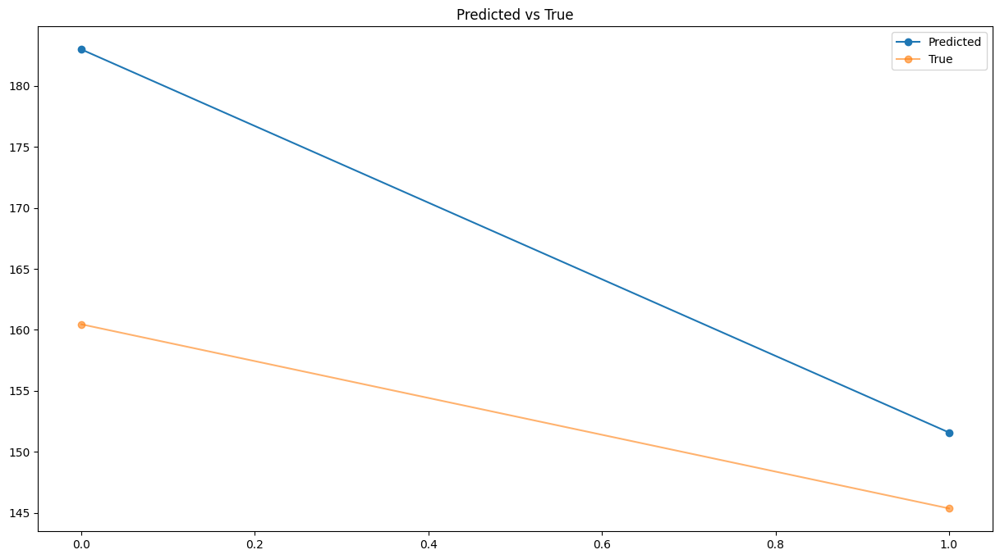

{'mae': 14.376736727627843,
 'mse': 16.528102195602468,
 'rmse': 273.1781621882791}

In [42]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Stacked LSTM con dropout

In [43]:
model = keras.models.load_model('modelos/'+paciente+'/stacked_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [44]:
len(array_Ytest)

3586

113/113 [==============================] - 2s 16ms/step


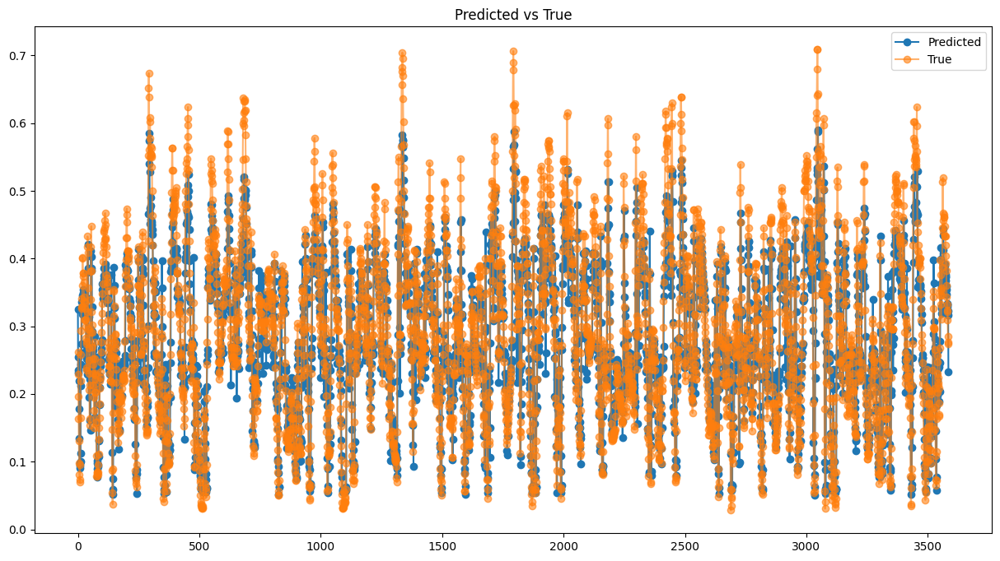

In [45]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [46]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.04529987452468217,
 'mse': 0.059301350514350676,
 'rmse': 0.0035166501728258795}

In [47]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,189.520020
1,146.633316
2,157.364410
3,148.434387
4,141.013641
...,...
3581,192.530197
3582,191.253738
3583,188.234482
3584,185.893311


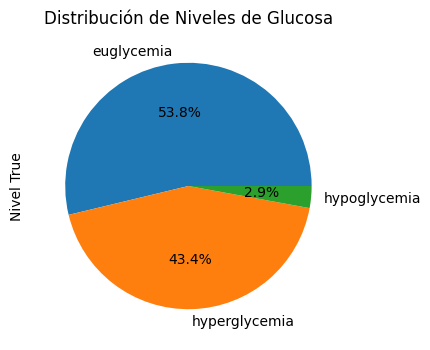

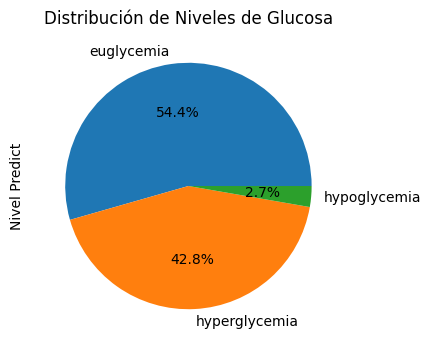

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,189.520020,hyperglycemia
1,145.363636,euglycemia,146.633316,euglycemia
2,130.272727,euglycemia,157.364410,euglycemia
3,115.181818,euglycemia,148.434387,euglycemia
4,100.090909,euglycemia,141.013641,euglycemia


In [48]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


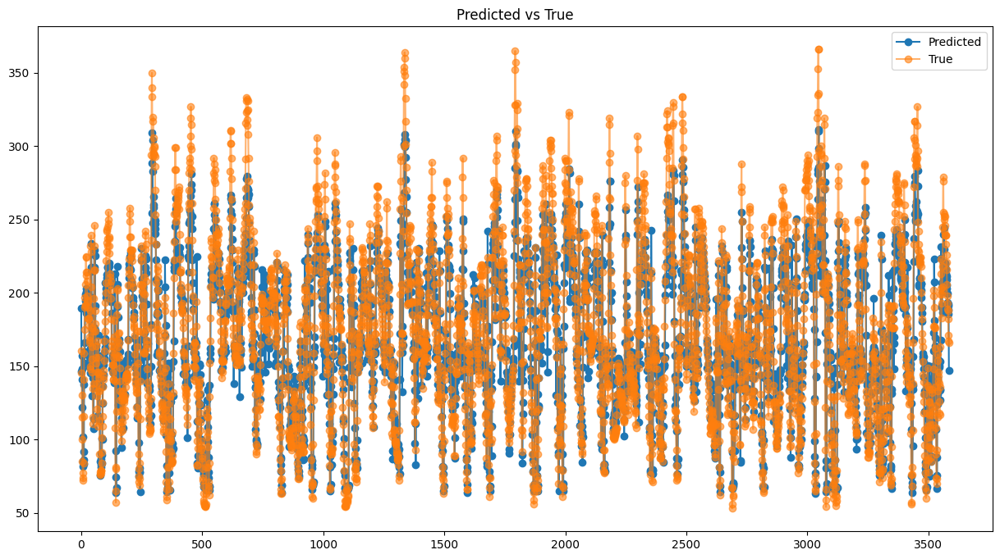

{'mae': 20.83794288779698,
 'mse': 27.278621983802758,
 'rmse': 744.1232173352071}

In [49]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [50]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [51]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,189.520020
2023-01-01 00:15:00,145.363636,146.633316
2023-01-01 00:30:00,130.272727,157.364410
2023-01-01 00:45:00,115.181818,148.434387
2023-01-01 01:00:00,100.090909,141.013641
...,...,...
2023-02-07 07:15:00,188.000000,192.530197
2023-02-07 07:30:00,182.000000,191.253738
2023-02-07 07:45:00,171.000000,188.234482
2023-02-07 08:00:00,167.000000,185.893311


AP, BE, EP: (0.8649930264993027, 0.10181311018131102, 0.033193863319386334)


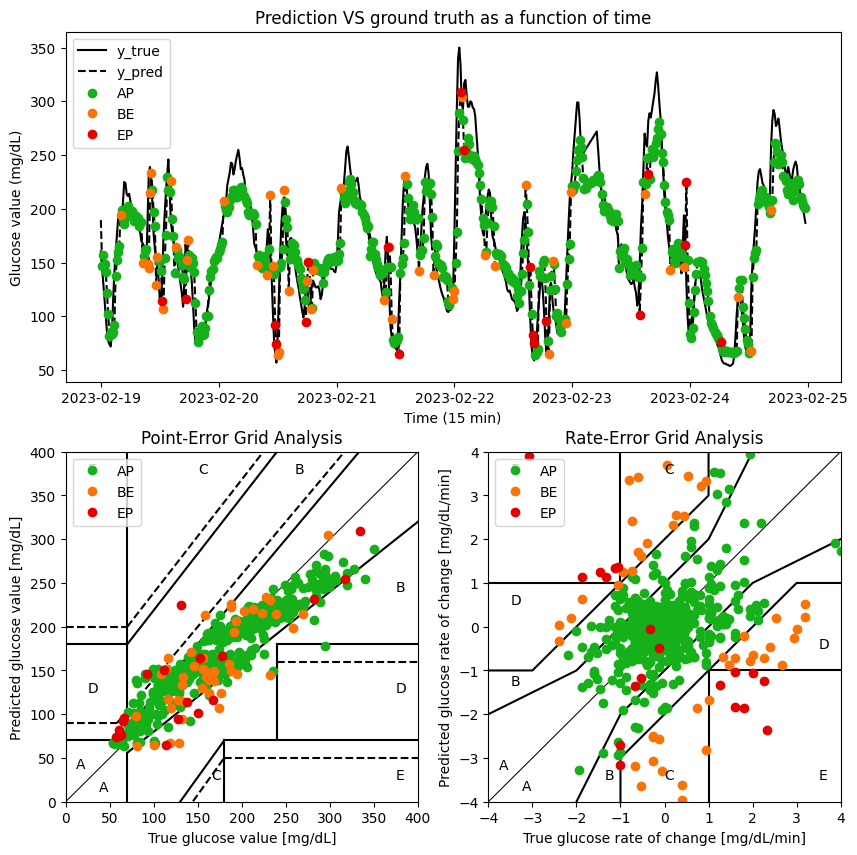

In [52]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [53]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,160.454545,189.520020,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,145.363636,146.633316,-1.006061,-2.859113,AP,A,B
2,2023-02-19 00:30:00,130.272727,157.364410,-1.006061,0.715406,AP,A,B
3,2023-02-19 00:45:00,115.181818,148.434387,-1.006061,-0.595335,AP,B,A
4,2023-02-19 01:00:00,100.090909,141.013641,-1.006061,-0.494716,AP,B,A
...,...,...,...,...,...,...,...,...
3581,2023-03-28 07:15:00,188.000000,192.530197,-0.066667,-0.048922,AP,A,A
3582,2023-03-28 07:30:00,182.000000,191.253738,-0.400000,-0.085097,AP,A,A
3583,2023-03-28 07:45:00,171.000000,188.234482,-0.733333,-0.201284,AP,A,A
3584,2023-03-28 08:00:00,167.000000,185.893311,-0.266667,-0.156078,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [54]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [55]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 41ms/step


,Glucose level Predict,Glucose level True
0,0.325044,0.261858
1,0.231812,0.229051


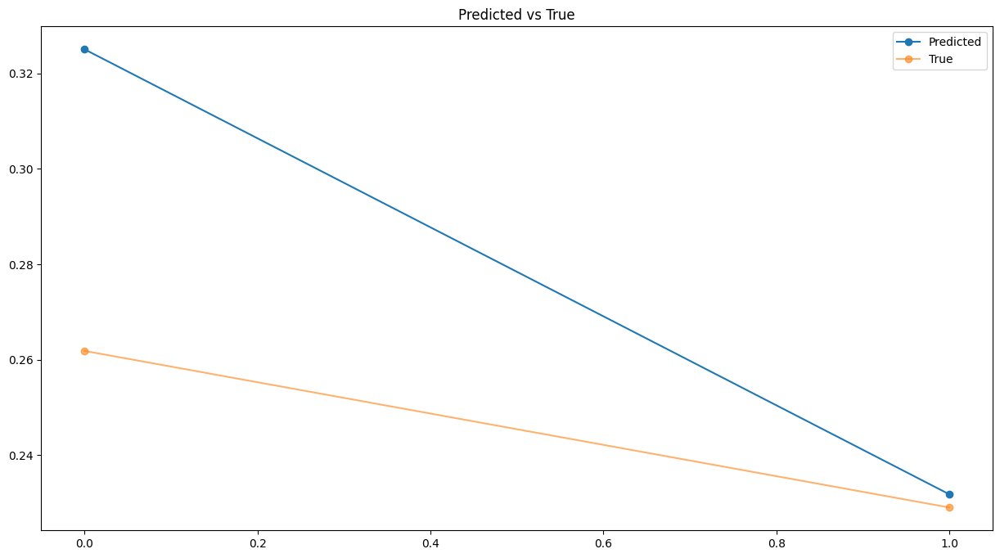

{'mae': 0.032973018153147265,
 'mse': 0.044721753419014854,
 'rmse': 0.0020000352288711666}

In [56]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [57]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,189.520035,160.454545
1,146.633316,145.363636


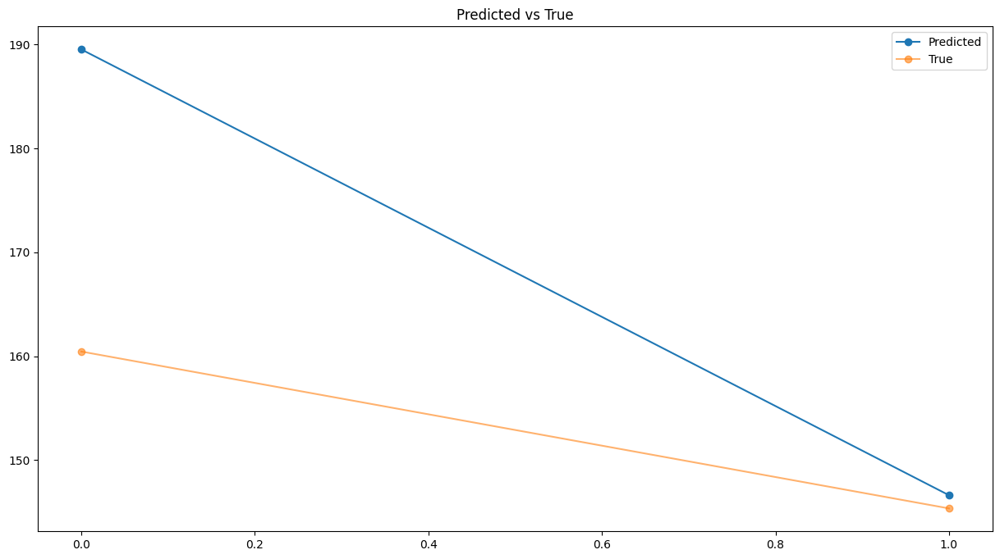

{'mae': 15.167584505948156,
 'mse': 20.57200472477541,
 'rmse': 423.2073783961818}

In [58]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Stacked LSTM sin dropout

In [59]:
model = keras.models.load_model('modelos/'+paciente+'/stacked_NO_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [60]:
len(array_Ytest)

3586

113/113 [==============================] - 2s 10ms/step


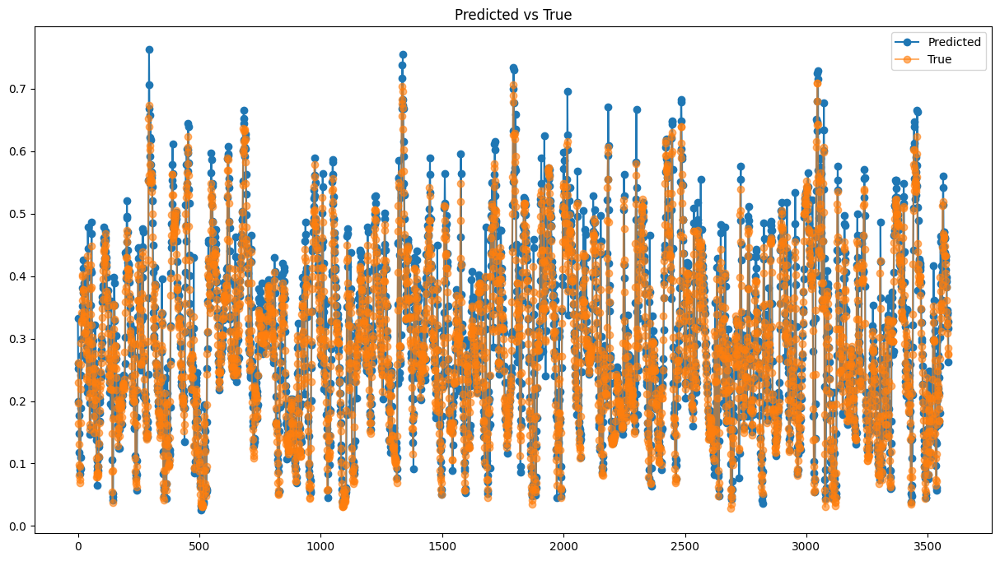

In [61]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [62]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.03769178069313655,
 'mse': 0.05193401415437729,
 'rmse': 0.0026971418261870603}

In [63]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,192.677521
1,159.683395
2,155.771683
3,131.428543
4,121.251030
...,...
3581,197.195709
3582,197.286758
3583,190.421356
3584,185.338547


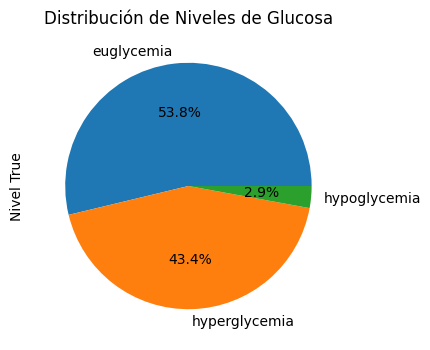

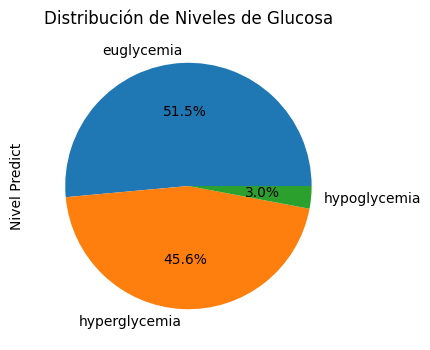

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,192.677521,hyperglycemia
1,145.363636,euglycemia,159.683395,euglycemia
2,130.272727,euglycemia,155.771683,euglycemia
3,115.181818,euglycemia,131.428543,euglycemia
4,100.090909,euglycemia,121.251030,euglycemia


In [64]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


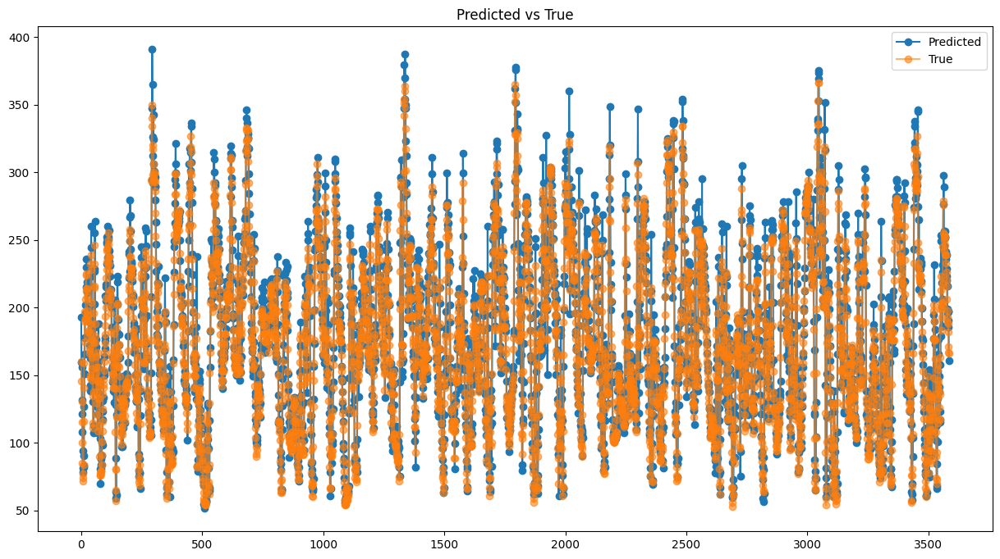

{'mae': 17.338219206234424,
 'mse': 23.889646240961593,
 'rmse': 570.7151975182904}

In [65]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [66]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [67]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,192.677521
2023-01-01 00:15:00,145.363636,159.683395
2023-01-01 00:30:00,130.272727,155.771683
2023-01-01 00:45:00,115.181818,131.428543
2023-01-01 01:00:00,100.090909,121.251030
...,...,...
2023-02-07 07:15:00,188.000000,197.195709
2023-02-07 07:30:00,182.000000,197.286758
2023-02-07 07:45:00,171.000000,190.421356
2023-02-07 08:00:00,167.000000,185.338547


AP, BE, EP: (0.8622036262203626, 0.09735006973500697, 0.040446304044630406)


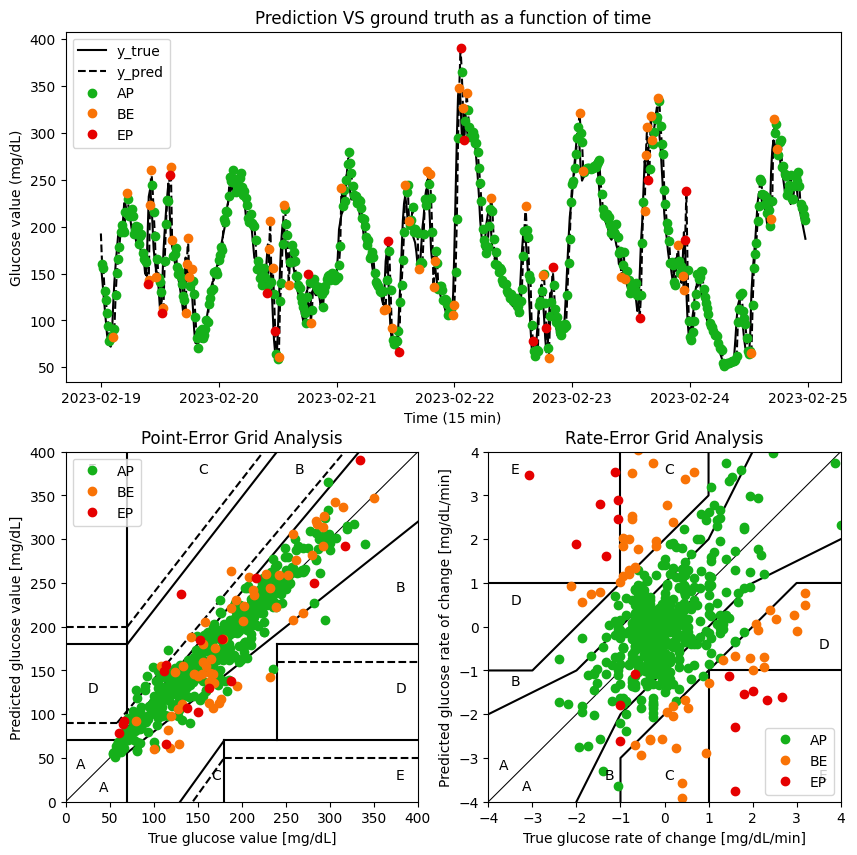

In [68]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [69]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,160.454545,192.677521,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,145.363636,159.683395,-1.006061,-2.199608,AP,A,B
2,2023-02-19 00:30:00,130.272727,155.771683,-1.006061,-0.260781,AP,A,A
3,2023-02-19 00:45:00,115.181818,131.428543,-1.006061,-1.622876,AP,A,A
4,2023-02-19 01:00:00,100.090909,121.251030,-1.006061,-0.678501,AP,A,A
...,...,...,...,...,...,...,...,...
3581,2023-03-28 07:15:00,188.000000,197.195709,-0.066667,0.084540,AP,A,A
3582,2023-03-28 07:30:00,182.000000,197.286758,-0.400000,0.006070,AP,A,A
3583,2023-03-28 07:45:00,171.000000,190.421356,-0.733333,-0.457693,AP,A,A
3584,2023-03-28 08:00:00,167.000000,185.338547,-0.266667,-0.338854,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [70]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [71]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 29ms/step


,Glucose level Predict,Glucose level True
0,0.331908,0.261858
1,0.260181,0.229051


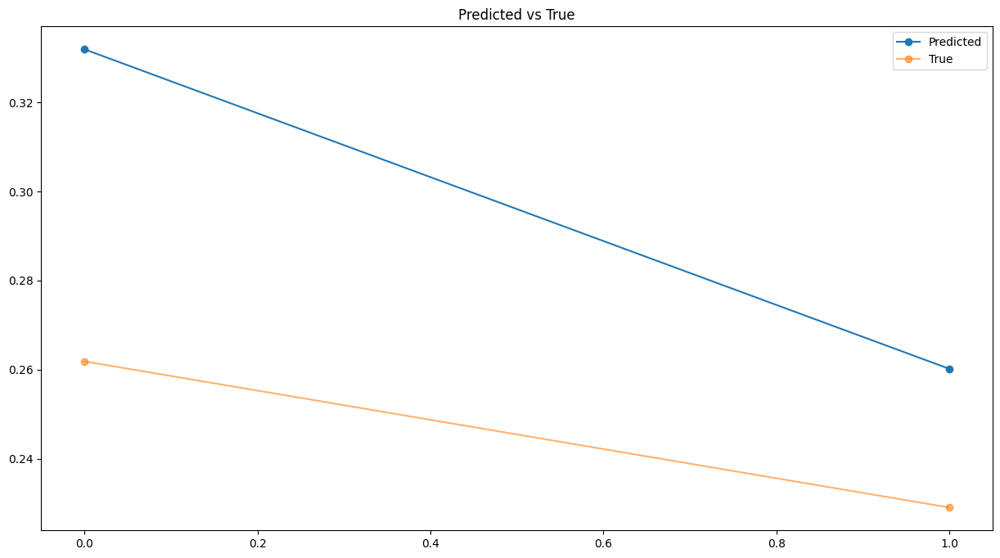

{'mae': 0.050589893622831866,
 'mse': 0.054203576811662296,
 'rmse': 0.0029380277391777747}

In [72]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [73]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,192.677490,160.454545
1,159.683411,145.363636


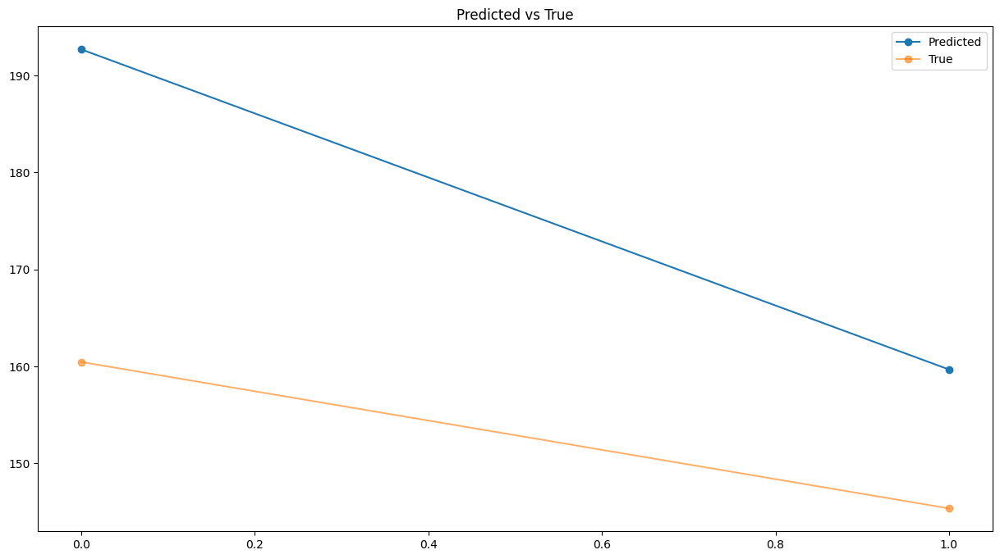

{'mae': 23.27135953036222,
 'mse': 24.933653018959372,
 'rmse': 621.6870528698618}

In [74]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Bidirectional LSTM con dropout

In [75]:
model = keras.models.load_model('modelos/'+paciente+'/bidirectional_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [76]:
len(array_Ytest)

3586

113/113 [==============================] - 2s 8ms/step


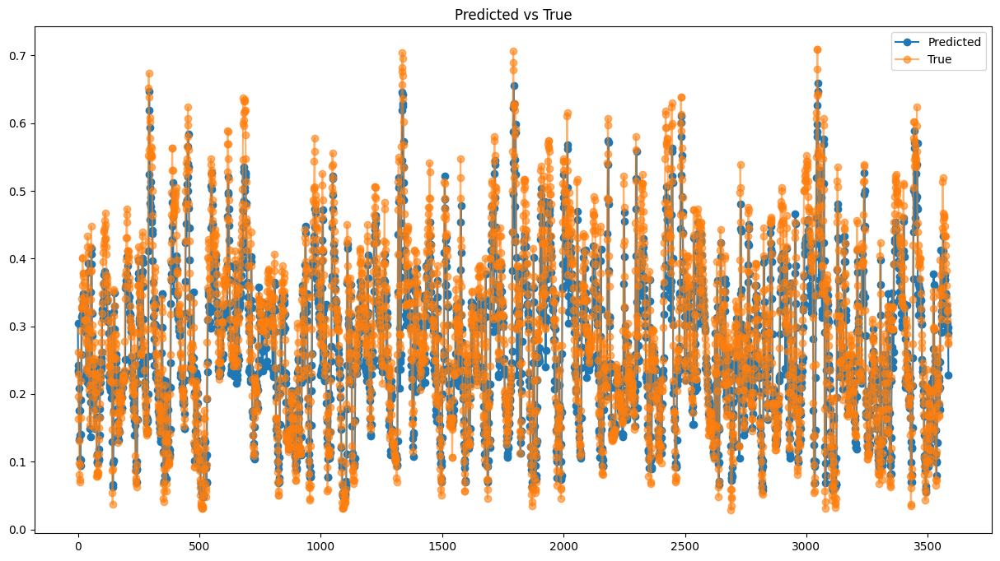

In [77]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [78]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.04778524186250963,
 'mse': 0.06501563389541395,
 'rmse': 0.0042270326508225}

In [79]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,179.958374
1,151.579300
2,148.028412
3,147.200211
4,135.648300
...,...
3581,177.135849
3582,174.953278
3583,177.291550
3584,173.411362


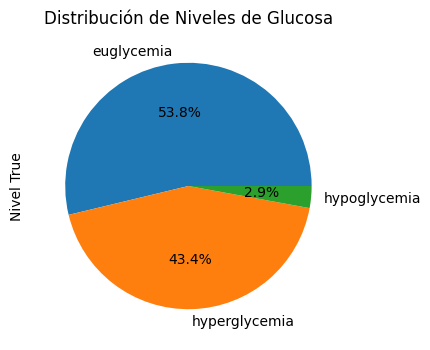

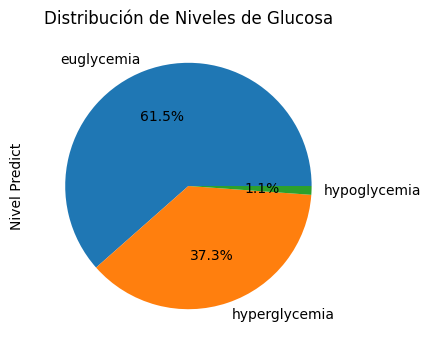

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,179.958374,euglycemia
1,145.363636,euglycemia,151.579300,euglycemia
2,130.272727,euglycemia,148.028412,euglycemia
3,115.181818,euglycemia,147.200211,euglycemia
4,100.090909,euglycemia,135.648300,euglycemia


In [80]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


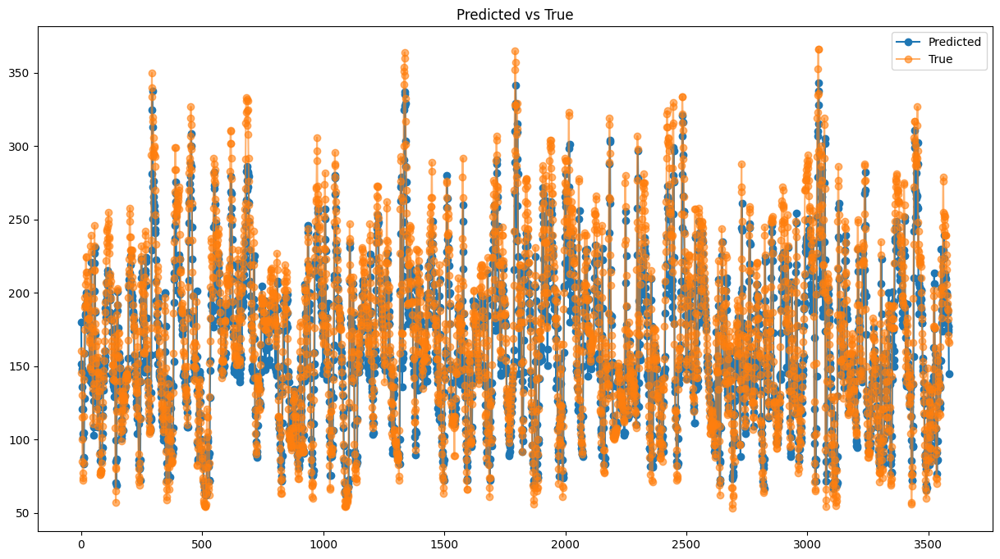

{'mae': 21.981210897755286,
 'mse': 29.907191382197094,
 'rmse': 894.4400963713641}

In [81]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [82]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [83]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,179.958374
2023-01-01 00:15:00,145.363636,151.579300
2023-01-01 00:30:00,130.272727,148.028412
2023-01-01 00:45:00,115.181818,147.200211
2023-01-01 01:00:00,100.090909,135.648300
...,...,...
2023-02-07 07:15:00,188.000000,177.135849
2023-02-07 07:30:00,182.000000,174.953278
2023-02-07 07:45:00,171.000000,177.291550
2023-02-07 08:00:00,167.000000,173.411362


AP, BE, EP: (0.8736401673640167, 0.08535564853556485, 0.04100418410041841)


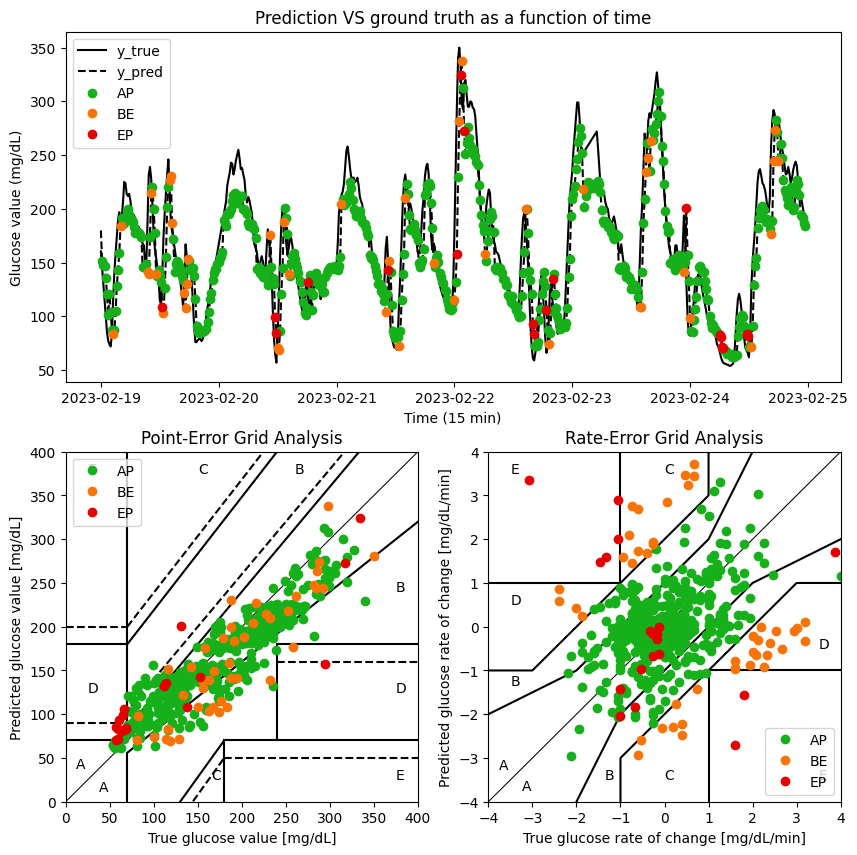

In [84]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [85]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,160.454545,179.958374,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,145.363636,151.579300,-1.006061,-1.891938,AP,A,A
2,2023-02-19 00:30:00,130.272727,148.028412,-1.006061,-0.236726,AP,A,A
3,2023-02-19 00:45:00,115.181818,147.200211,-1.006061,-0.055213,AP,A,A
4,2023-02-19 01:00:00,100.090909,135.648300,-1.006061,-0.770127,AP,B,A
...,...,...,...,...,...,...,...,...
3581,2023-03-28 07:15:00,188.000000,177.135849,-0.066667,-0.197259,AP,A,A
3582,2023-03-28 07:30:00,182.000000,174.953278,-0.400000,-0.145505,AP,A,A
3583,2023-03-28 07:45:00,171.000000,177.291550,-0.733333,0.155885,AP,A,A
3584,2023-03-28 08:00:00,167.000000,173.411362,-0.266667,-0.258679,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [86]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [87]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 54ms/step


,Glucose level Predict,Glucose level True
0,0.304257,0.261858
1,0.242564,0.229051


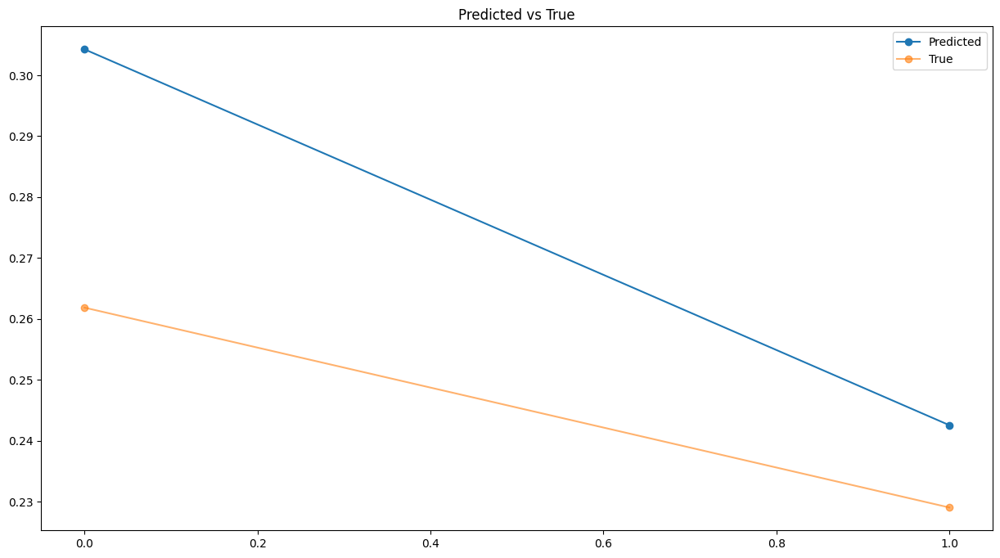

{'mae': 0.027955983443693683,
 'mse': 0.031466741393397314,
 'rmse': 0.0009901558139189441}

In [88]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [89]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,179.958374,160.454545
1,151.579315,145.363636


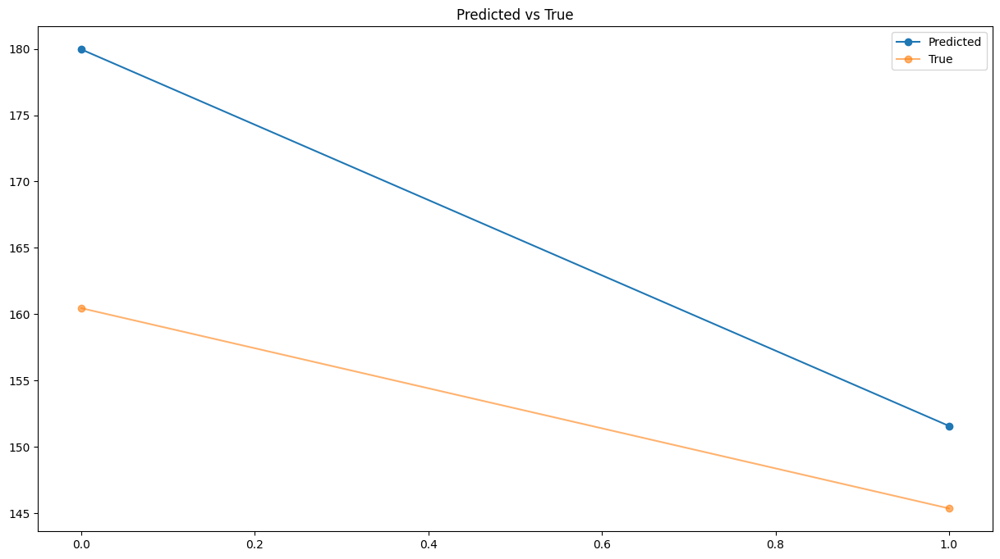

{'mae': 12.859753695401281,
 'mse': 14.474701932369399,
 'rmse': 209.51699603093843}

In [90]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Bidirectional LSTM sin dropout

In [91]:
model = keras.models.load_model('modelos/'+paciente+'/bidirectional_NO_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [92]:
len(array_Ytest)

3586

113/113 [==============================] - 2s 9ms/step


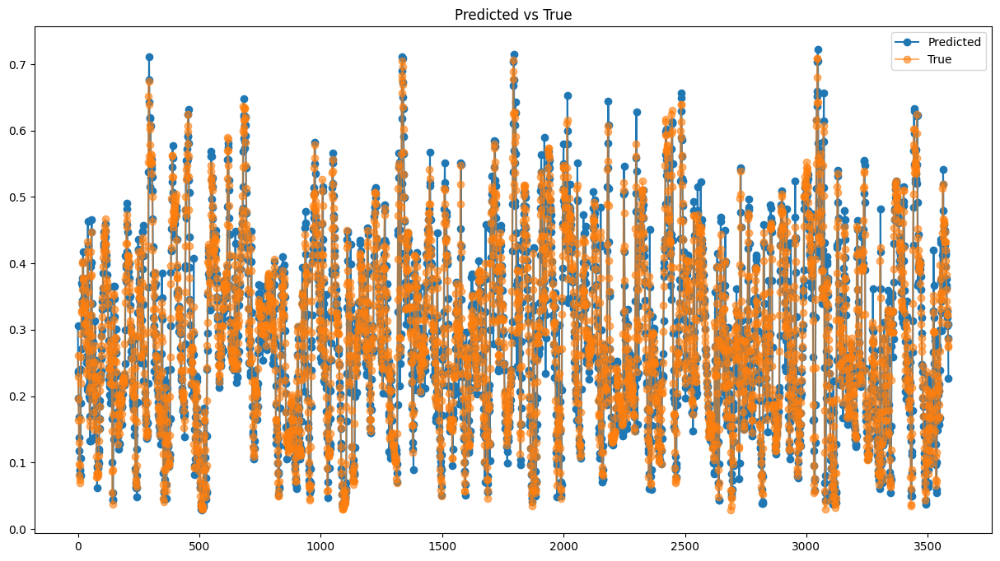

In [93]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [94]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.03520980905106575,
 'mse': 0.05139542367972901,
 'rmse': 0.00264148957521885}

In [95]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,180.720917
1,148.400223
2,149.522064
3,130.608780
4,117.464096
...,...
3581,180.554855
3582,181.415161
3583,182.027206
3584,172.373474


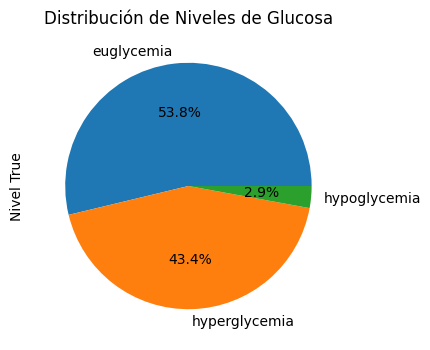

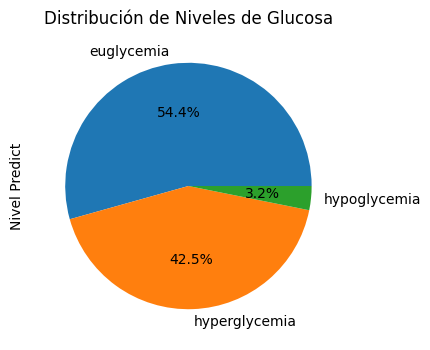

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,180.720917,hyperglycemia
1,145.363636,euglycemia,148.400223,euglycemia
2,130.272727,euglycemia,149.522064,euglycemia
3,115.181818,euglycemia,130.608780,euglycemia
4,100.090909,euglycemia,117.464096,euglycemia


In [96]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


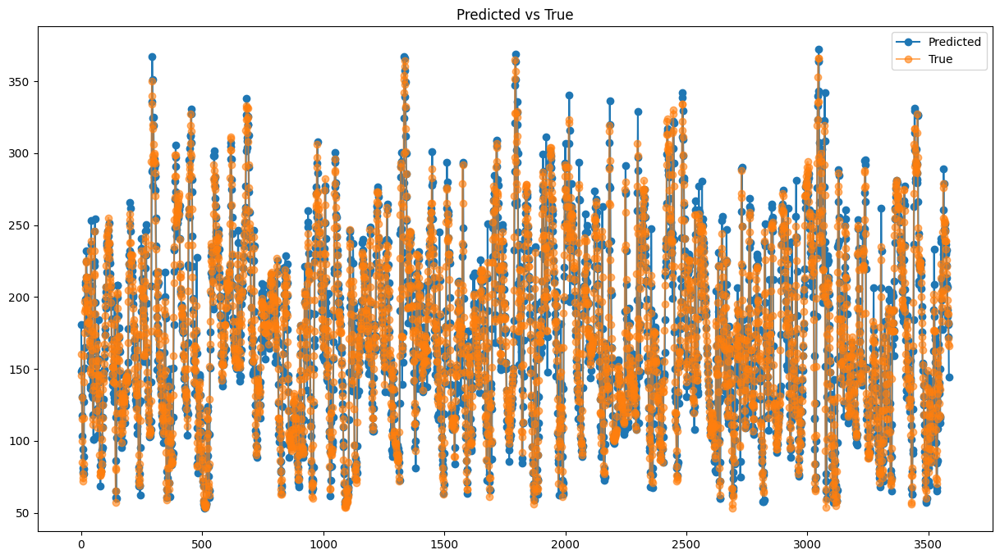

{'mae': 16.19651209913185,
 'mse': 23.641894485030686,
 'rmse': 558.9391748413244}

In [97]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [98]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [99]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,180.720917
2023-01-01 00:15:00,145.363636,148.400223
2023-01-01 00:30:00,130.272727,149.522064
2023-01-01 00:45:00,115.181818,130.608780
2023-01-01 01:00:00,100.090909,117.464096
...,...,...
2023-02-07 07:15:00,188.000000,180.554855
2023-02-07 07:30:00,182.000000,181.415161
2023-02-07 07:45:00,171.000000,182.027206
2023-02-07 08:00:00,167.000000,172.373474


AP, BE, EP: (0.8739191073919107, 0.0898186889818689, 0.03626220362622036)


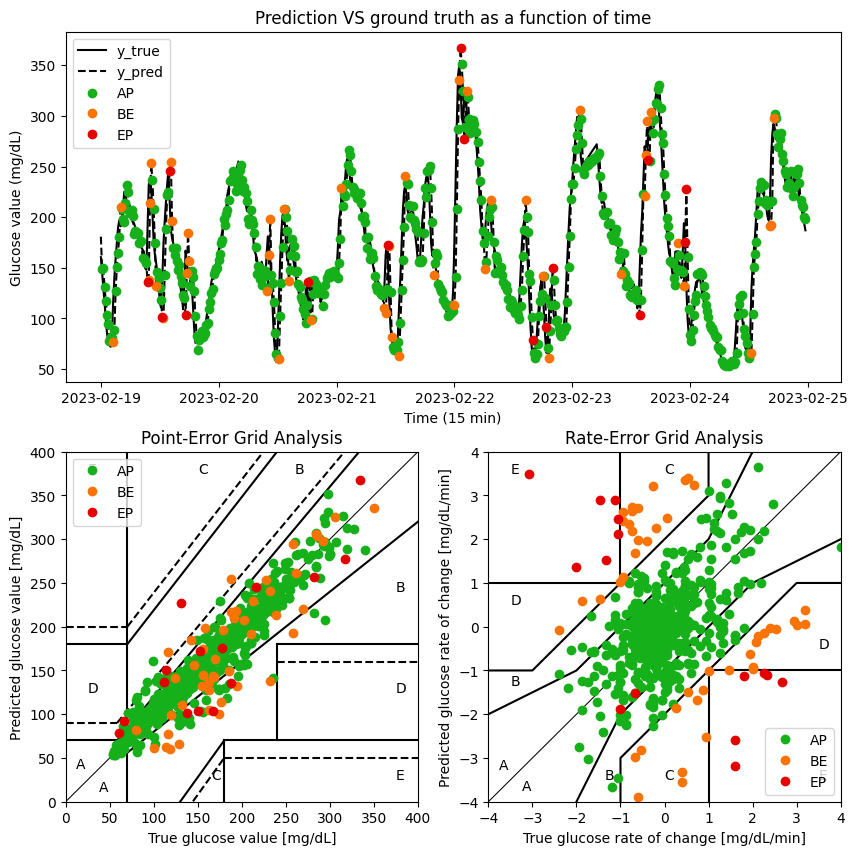

In [100]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [101]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,160.454545,180.720917,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,145.363636,148.400223,-1.006061,-2.154713,AP,A,B
2,2023-02-19 00:30:00,130.272727,149.522064,-1.006061,0.074789,AP,A,B
3,2023-02-19 00:45:00,115.181818,130.608780,-1.006061,-1.260886,AP,A,A
4,2023-02-19 01:00:00,100.090909,117.464096,-1.006061,-0.876312,AP,A,A
...,...,...,...,...,...,...,...,...
3581,2023-03-28 07:15:00,188.000000,180.554855,-0.066667,-0.379361,AP,A,A
3582,2023-03-28 07:30:00,182.000000,181.415161,-0.400000,0.057354,AP,A,A
3583,2023-03-28 07:45:00,171.000000,182.027206,-0.733333,0.040803,AP,A,A
3584,2023-03-28 08:00:00,167.000000,172.373474,-0.266667,-0.643582,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [102]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [103]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 50ms/step


,Glucose level Predict,Glucose level True
0,0.305915,0.261858
1,0.235653,0.229051


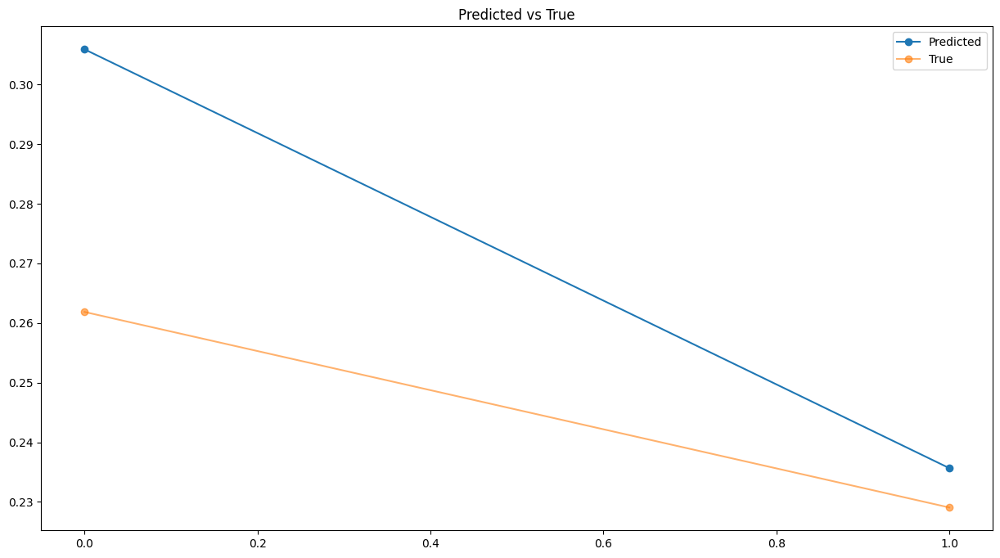

{'mae': 0.025329244001345202,
 'mse': 0.031500957588728326,
 'rmse': 0.0009923103290068608}

In [104]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [105]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,180.720901,160.454545
1,148.400177,145.363636


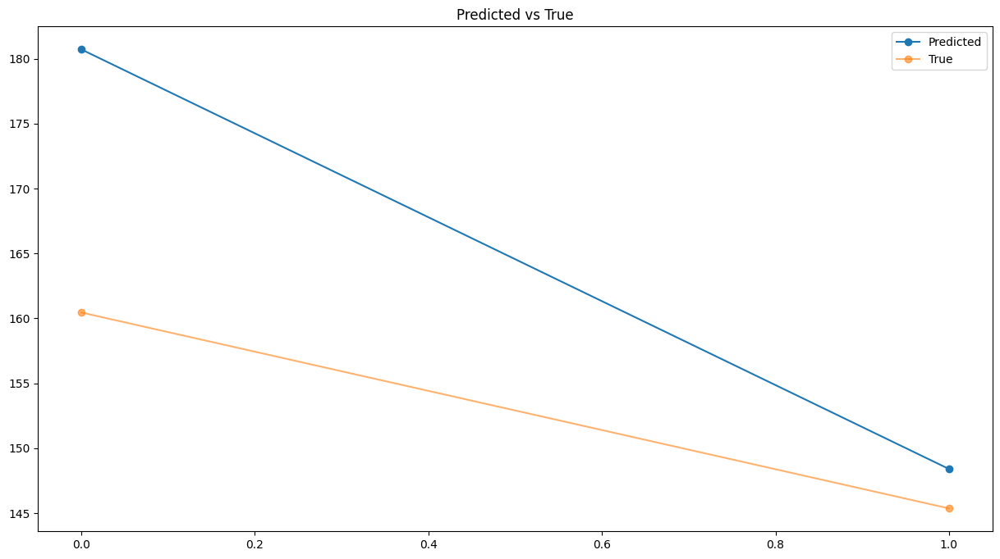

{'mae': 11.651448336514562,
 'mse': 14.490441090144078,
 'rmse': 209.97288298693587}

In [106]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)